In [1]:
import os
import time
import re 
import sys

#to supress warnings 
import warnings 
warnings.filterwarnings('ignore')

import pandas as pd 
import numpy as np
import plotly.express as px
import plotly.offline as pyo

#to read stocks from Yahoo
from pandas_datareader.data import DataReader
import yfinance as yf 
from pandas_datareader import data as pdr
from datetime import datetime 

# for data encoding
import category_encoders as ce

# for stationarity checks
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf

from statsmodels.tsa.arima.model import ARIMA

pd.options.plotting.backend = "plotly"
pyo.init_notebook_mode()
yf.pdr_override()

In [15]:
# Define the stock symbol and the time range
stock_symbols = ["AAPL", "MSFT", "GOOGL"]
#start_date = datetime.now() - pd.DateOffset(years=3)
#end_date = datetime.now()
start_date = datetime(2005, 1, 1)  # January 2018
end_date = datetime(2023, 1, 31)  # January 2023

# Fetch the stock data
stock_data = {}
for symbol in stock_symbols:
    stock_data[symbol] = pdr.get_data_yahoo(symbol, start=start_date, end=end_date)

#Display the first few rows to check
stock_data["MSFT"].head()

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2005-01-03,26.799999,26.950001,26.650000,26.740000,18.732990,65002900
2005-01-04,26.870001,27.100000,26.660000,26.840000,18.803047,109442100
2005-01-05,26.840000,27.100000,26.760000,26.780001,18.761024,72463500
2005-01-06,26.850000,27.059999,26.639999,26.750000,18.740009,76890500
2005-01-07,26.820000,26.889999,26.620001,26.670000,18.683954,68723300


In [3]:
#Convert to a panel dataset
final = []

for symbol in stock_symbols:
    tmp_df = pd.DataFrame()
    vals = stock_data[symbol]['Close'].tolist()

    tmp_df['Series'] = [symbol] * len(vals)
    tmp_df['Date'] = stock_data[symbol].index
    tmp_df['Values'] = vals
    final.append(tmp_df)

panel_data = pd.concat(final)
panel_data.set_index(['Series', 'Date'], inplace=True)

panel_data

Values
Series Date                 
AAPL   2005-01-03   1.130179
       2005-01-04   1.141786
       2005-01-05   1.151786
       2005-01-06   1.152679
       2005-01-07   1.236607
...                      ...
GOOGL  2023-01-24  97.699997
       2023-01-25  95.220001
       2023-01-26  97.519997
       2023-01-27  99.370003
       2023-01-30  96.940002

[13650 rows x 1 columns]

In [4]:
#Plotting: Overall Time Series first before preprocessing 
px.line(panel_data.reset_index(), 
        x = 'Date', 
        y = 'Values', 
        color = 'Series',
        title = 'Plot of Time Series')

In [5]:
#Check stationarity 
def check_stationarity(series):
    return adfuller(series, regression = 'c')[1]

In [6]:
# sort values first, then apply residual checks
results = panel_data.sort_values(by = ['Series', 'Date']).groupby(['Series'])['Values'].apply(check_stationarity)

# 100% of time series are not stationary
np.mean(results > .05)

1.0

In [7]:
#Preprocessing, differencing first
differences = panel_data.groupby(['Series'])['Values'].diff().reset_index().dropna()
results_diff = differences.groupby(['Series'])['Values'].apply(check_stationarity)
print("Proportion of non-stationary series after differencing:", np.mean(results_diff > .05))

# plot the differences
px.line(differences, x= 'Date', y = 'Values', color = 'Series')

Proportion of non-stationary series after differencing: 0.0


In [8]:
#Log transformation
log_returns = np.log1p(panel_data).groupby(['Series'])['Values'].diff().reset_index().dropna()
results_log = log_returns.groupby(['Series'])['Values'].apply(check_stationarity)
print("Proportion of non-stationary series after log returns:", np.mean(results_log > .05))

# plot the log differences
px.line(log_returns, x= 'Date', y = 'Values', color = 'Series')

Proportion of non-stationary series after log returns: 0.0


In [9]:
stock_data

{'AAPL':                   Open        High         Low       Close   Adj Close   
 Date                                                                     
 2005-01-03    1.156786    1.162679    1.117857    1.130179    0.959292  \
 2005-01-04    1.139107    1.169107    1.124464    1.141786    0.969144   
 2005-01-05    1.151071    1.165179    1.143750    1.151786    0.977632   
 2005-01-06    1.154821    1.159107    1.130893    1.152679    0.978390   
 2005-01-07    1.160714    1.243393    1.156250    1.236607    1.049628   
 ...                ...         ...         ...         ...         ...   
 2023-01-24  140.309998  143.160004  140.300003  142.529999  141.924484   
 2023-01-25  140.889999  142.429993  138.809998  141.860001  141.257339   
 2023-01-26  143.169998  144.250000  141.899994  143.960007  143.348419   
 2023-01-27  143.160004  147.229996  143.080002  145.929993  145.310043   
 2023-01-30  144.960007  145.550003  142.850006  143.000000  142.392487   
 
               

In [10]:
#Difference in log returns
final = []

for symbol in stock_symbols:
    print(f"Processing {symbol}...")

    vals = stock_data[symbol]['Close'].tolist()
    log_diffs = np.log(np.array(vals[1:]) / np.array(vals[:-1]))
    differences_log_diffs = log_diffs[1:] - log_diffs[:-1]
    
    tmp_df = pd.DataFrame()
    tmp_df['Series'] = [symbol] * len(differences_log_diffs)
    tmp_df['Date'] = stock_data[symbol].index[2:]  # Excluded the first two dates because log diff
    tmp_df['Values'] = differences_log_diffs
    final.append(tmp_df)

panel_data_log_diffs = pd.concat(final)
panel_data_log_diffs.set_index(['Series', 'Date'], inplace=True)

results_log_diffs = panel_data_log_diffs.groupby(['Series'])['Values'].apply(check_stationarity)
print("Proportion of non-stationary series after differencing log returns:", np.mean(results_log_diffs > .05))

panel_data_log_diffs_reset = panel_data_log_diffs.reset_index()
px.line(panel_data_log_diffs_reset, x= 'Date', y = 'Values', color = 'Series') 

Processing AAPL...
Processing MSFT...
Processing GOOGL...
Proportion of non-stationary series after differencing log returns: 0.0


In [11]:
panel_data_log_diffs

Values
Series Date                
AAPL   2005-01-05 -0.001498
       2005-01-06 -0.007945
       2005-01-07  0.069508
       2005-01-10 -0.074479
       2005-01-11 -0.061736
...                     ...
GOOGL  2023-01-24 -0.039063
       2023-01-25 -0.004545
       2023-01-26  0.049579
       2023-01-27 -0.005075
       2023-01-30 -0.043551

[13644 rows x 1 columns]

In [12]:
#Preprocessing
#Store dataframes after preprocessing
dfs_list = []

#Get each stock symbol
symbols = panel_data_log_diffs.index.get_level_values('Series').unique()
for symbol in symbols:
    #subset dataframe per stock
    subset = panel_data_log_diffs.loc[symbol]

    #convert index to datetime to set frequency and use ffill
    subset.index = pd.to_datetime(subset.index)
    subset = subset.asfreq('B').fillna(method='ffill')

    #convert index back to a period and append series column
    subset.index = subset.index.to_period('D')
    subset['Series'] = symbol
    subset.set_index('Series', append=True, inplace=True)
    subset = subset.swaplevel('Series', 'Date')

    dfs_list.append(subset)

# Concatenate the processed dataframes
panel_data_processed = pd.concat(dfs_list)


In [13]:
panel_data_processed

Values
Series Date                
AAPL   2005-01-05 -0.001498
       2005-01-06 -0.007945
       2005-01-07  0.069508
       2005-01-10 -0.074479
       2005-01-11 -0.061736
...                     ...
GOOGL  2023-01-24 -0.039063
       2023-01-25 -0.004545
       2023-01-26  0.049579
       2023-01-27 -0.005075
       2023-01-30 -0.043551

[14142 rows x 1 columns]

In [14]:
import numpy as np
import pandas as pd
from pmdarima import auto_arima
from arch import arch_model
from statsmodels.tsa.arima.model import ARIMA

predictions = {}

for stock in ['AAPL', 'GOOGL', 'MSFT']:
    data = panel_data_processed.loc[stock]['Values'].dropna()

    # Splitting data into training and testing sets (80-20 split)
    train_size = int(len(data) * 0.8)
    train, test = data[0:train_size], data[train_size:]

    # Setup ARIMA 
    model_arima = auto_arima(train, seasonal=False, trace=True)
    model_arima_fit = model_arima.fit(train)

    # Predict the test set using ARIMA
    arima_predictions = []
    for t in test:
        # One step ahead prediction
        arima_pred = model_arima.predict(n_periods=1)[0]
        arima_predictions.append(arima_pred)

        # Adding the true value to the training set and then updating the model
        train = np.append(train, t)
        model_arima = model_arima.update(t)

    # Calculate residuals
    residuals = model_arima.resid()

    # Get volatility using GARCH
    garch_model = arch_model(residuals, vol='Garch', p=1, q=1)
    garch_fit = garch_model.fit(disp='off')
    garch_forecast = garch_fit.forecast(start=0)
    next_volatility = garch_forecast.variance.values[-1, 0]  # get the last forecasted variance
    next_std = np.sqrt(next_volatility)  # standard deviation
    
    garch_preds = np.random.normal(0, next_std, len(test))

    #print("arima pred: ", arima_predictions)
    #print("garch pred: ", garch_preds)

    # Storing predictions
    predictions[stock] = {
        "Final Predictions": [arima_pred + garch_pred for arima_pred, garch_pred in zip(arima_predictions, garch_preds)],
        "ARIMA Predictions": arima_predictions,
        "GARCH Predictions": garch_preds
    }  


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-17783.134, Time=1.21 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=-16048.819, Time=0.21 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=-16904.239, Time=0.12 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=-17781.052, Time=0.53 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=-17784.580, Time=0.64 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=-17786.402, Time=0.53 sec
 ARIMA(0,0,3)(0,0,0)[0]             : AIC=-17786.424, Time=1.36 sec
 ARIMA(1,0,3)(0,0,0)[0]             : AIC=-17784.386, Time=1.80 sec
 ARIMA(0,0,4)(0,0,0)[0]             : AIC=-17784.458, Time=1.39 sec
 ARIMA(1,0,4)(0,0,0)[0]             : AIC=-17782.571, Time=1.02 sec
 ARIMA(0,0,3)(0,0,0)[0] intercept   : AIC=-17781.972, Time=1.31 sec

Best model:  ARIMA(0,0,3)(0,0,0)[0]          
Total fit time: 10.122 seconds
Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=-18784.253, Time=2.18 sec
 ARIMA(0,0,0)(0,0,0)

In [16]:
#Initialize dataframe to store results
results_df = pd.DataFrame(columns=['Stock', 'Date', 'Original Price', 'ARIMA Prediction', 'GARCH Prediction', 'Final Prediction'])

for stock, predictions_data in predictions.items():
    #Get original y_true vals 
    stock_data_vals = stock_data[stock]['Close'][-len(predictions_data['ARIMA Predictions']):]
    date_index = stock_data_vals.index
    original_prices = stock_data_vals.values
    
    # Transform predictions back to original prices
    arima_predictions_original = np.exp(np.cumsum(predictions_data['ARIMA Predictions'])) * original_prices[0]
    garch_predictions_original = np.exp(np.cumsum(predictions_data['GARCH Predictions'])) * original_prices[0]
    final_predictions_original = np.exp(np.cumsum(predictions_data['Final Predictions'])) * original_prices[0]

    # Check lengths of the arrays
    print(f"Stock: {stock}")
    print(f"Date Index Length: {len(date_index)}")
    print(f"Original Prices Length: {len(original_prices)}")
    print(f"ARIMA Predictions Length: {len(arima_predictions_original)}")
    print(f"GARCH Predictions Length: {len(garch_predictions_original)}")
    print(f"Final Predictions Length: {len(final_predictions_original)}")
    
    # Create dataframe for each stock 
    stock_results = pd.DataFrame({
        'Stock': [stock] * len(date_index),
        'Date': date_index,
        'Original Price': original_prices,
        'ARIMA Prediction': arima_predictions_original,
        'GARCH Prediction': garch_predictions_original,
        'Final Prediction': final_predictions_original
    })

    # Append stock results to the overall results df
    results_df = pd.concat([results_df, stock_results], ignore_index=True)

results_df


Stock: AAPL
Date Index Length: 943
Original Prices Length: 943
ARIMA Predictions Length: 943
GARCH Predictions Length: 943
Final Predictions Length: 943
Stock: GOOGL
Date Index Length: 943
Original Prices Length: 943
ARIMA Predictions Length: 943
GARCH Predictions Length: 943
Final Predictions Length: 943
Stock: MSFT
Date Index Length: 943
Original Prices Length: 943
ARIMA Predictions Length: 943
GARCH Predictions Length: 943
Final Predictions Length: 943


,Stock,Date,Original Price,ARIMA Prediction,GARCH Prediction,Final Prediction
0,AAPL,2019-05-03,52.937500,53.330914,53.530661,53.928484
1,AAPL,2019-05-06,52.119999,53.247244,54.939614,55.261073
2,AAPL,2019-05-07,50.715000,53.623936,53.803167,54.500828
3,AAPL,2019-05-08,50.724998,53.851502,53.613846,54.539525
4,AAPL,2019-05-09,50.180000,54.621294,54.721815,56.462363
...,...,...,...,...,...,...
2824,MSFT,2023-01-24,242.039993,52.274369,200.125247,81.159204
2825,MSFT,2023-01-25,240.610001,52.828632,204.466730,83.799055
2826,MSFT,2023-01-26,248.000000,53.432053,199.074272,82.520928
2827,MSFT,2023-01-27,248.160004,52.173681,202.889909,82.121908


In [17]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

metrics = []

def calculate_metrics(y_true, y_pred):
    mape = mean_absolute_percentage_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    
    return {
        "MAPE": mape,
        "RMSE": rmse,
        "MAE": mae,
    }

for stock in predictions:
    y_true = results_df[results_df['Stock'] == stock]['Original Price']
    y_arima = results_df[results_df['Stock'] == stock]['ARIMA Prediction']
    y_garch = results_df[results_df['Stock'] == stock]['GARCH Prediction']
    y_final = results_df[results_df['Stock'] == stock]['Final Prediction']

    for model, y_pred in [("Final", y_final), ("ARIMA", y_arima), ("GARCH", y_garch)]:
        metrics_values = calculate_metrics(y_true, y_pred)
        metrics.append({
            'Stock': stock,
            'Model': model,
            'MAPE': metrics_values['MAPE'],
            'RMSE': metrics_values['RMSE'],
            'MAE': metrics_values['MAE']
        })

# Create dataframe from metrics 
metrics_df = pd.DataFrame(metrics)

metrics_df


,Stock,Model,MAPE,RMSE,MAE
0,AAPL,Final,0.629515,99.743868,84.975021
1,AAPL,ARIMA,0.566191,90.804245,77.001126
2,AAPL,GARCH,0.569946,89.502392,76.645827
3,GOOGL,Final,0.682960,83.154540,72.300215
4,GOOGL,ARIMA,0.515974,71.721702,57.809098
5,GOOGL,GARCH,0.596988,70.775803,62.427234
6,MSFT,Final,0.552739,143.506095,126.441089
7,MSFT,ARIMA,0.504566,157.649681,130.565131
8,MSFT,GARCH,0.313699,80.570304,67.142481


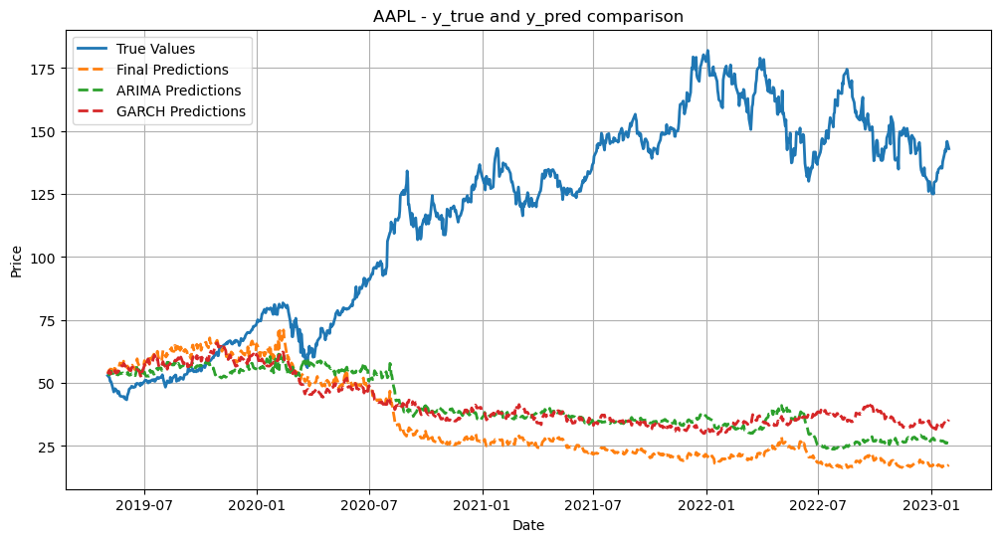

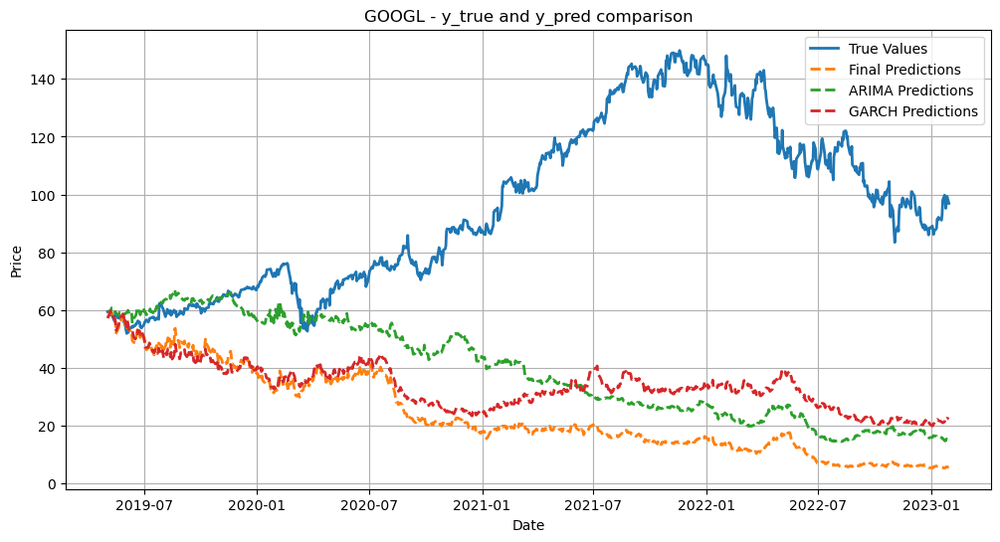

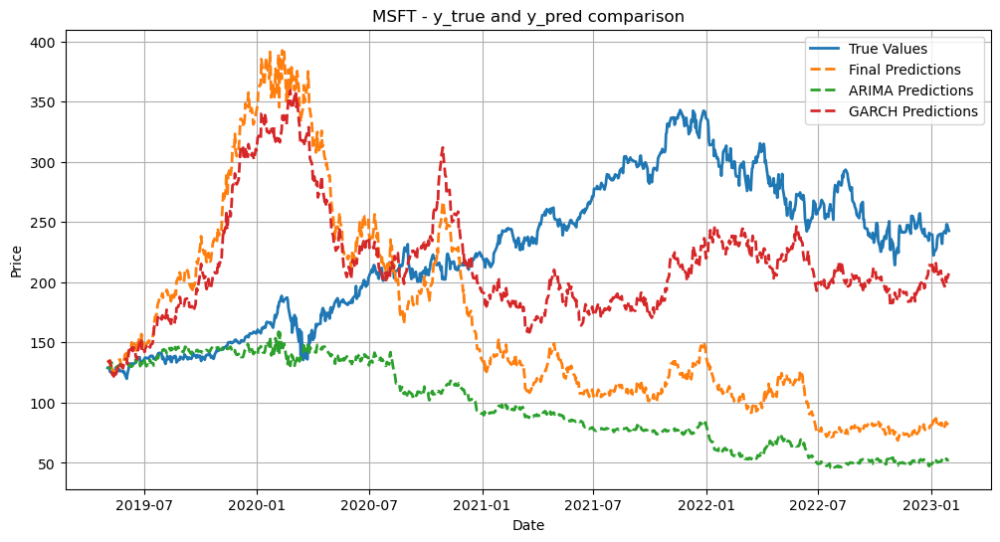

In [18]:
import os

base_dir = '../results'
now = datetime.now()
date_time_str = now.strftime('%Y%m%d_%H%M%S')
new_dir = os.path.join(base_dir, f"arima_baseline_{date_time_str}")

if not os.path.exists(new_dir):
    os.makedirs(new_dir)

# Save to txt file
results_filename = os.path.join(new_dir, 'results.txt')
results_df.to_csv(results_filename, sep='\t', index=False)

metrics_filename = os.path.join(new_dir, 'metrics.txt')
metrics_df.to_csv(metrics_filename, sep='\t', index=False)

import matplotlib.pyplot as plt

stocks = ['AAPL', 'GOOGL', 'MSFT']

for stock in stocks:
    # Filter results_df for each stock
    filtered_df = results_df[results_df['Stock'] == stock]

    # Extract date, original price, and predictions 
    dates = filtered_df['Date']
    y_true = filtered_df['Original Price']
    y_final_pred = filtered_df['Final Prediction']
    y_arima_pred = filtered_df['ARIMA Prediction']
    y_garch_pred = filtered_df['GARCH Prediction']

    #Plotting y_true, y_pred vs time
    plt.figure(figsize=(12, 6))
    plt.plot(dates, y_true, label='True Values', linewidth=2)
    plt.plot(dates, y_final_pred, label='Final Predictions', linestyle='--', linewidth=2)
    plt.plot(dates, y_arima_pred, label='ARIMA Predictions', linestyle='--', linewidth=2)
    plt.plot(dates, y_garch_pred, label='GARCH Predictions', linestyle='--', linewidth=2)
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.title(f'{stock} - y_true and y_pred comparison')
    plt.legend()
    plt.grid(True)
    plt.savefig(os.path.join(new_dir, f'{stock}_plot.png'))  # Save each plot with the stock name

plt.show()

